For this analysis, we will be looking at an extended version of the Salary datas except this one will have around 397 observations. We will be looking at salary data of college professors in a midtown college to determine what features are statistically significant to our response, which is Salary. Once again we will be looking at sex, rank, discipline, years of service, and years since phd. We will be creating several models and then comparing each model's prediction ability in the end. 

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, ElasticNetCV
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.compose import TransformedTargetRegressor
from statsmodels.stats.diagnostic import linear_reset, het_breuschpagan as bptest
from statsmodels.stats.outliers_influence import OLSInfluence, variance_inflation_factor
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.anova import anova_lm
from scipy.stats import t
from patsy import dmatrix
import rpowertransform
from rpowertransform.multivariate import MultivariatePowerTransform

salaries = pd.read_csv(r"C:\Users\tariq\Desktop\Python and R Buda 1\Salaries.csv")
print(salaries.head())

       rank discipline  yrs.since.phd  yrs.service   sex  salary
0      Prof          B             19           18  Male  139750
1      Prof          B             20           16  Male  173200
2  AsstProf          B              4            3  Male   79750
3      Prof          B             45           39  Male  115000
4      Prof          B             40           41  Male  141500


In [2]:
print(salaries.describe(include = 'all'))

        rank discipline  yrs.since.phd  yrs.service   sex         salary
count    397        397     397.000000   397.000000   397     397.000000
unique     3          2            NaN          NaN     2            NaN
top     Prof          B            NaN          NaN  Male            NaN
freq     266        216            NaN          NaN   358            NaN
mean     NaN        NaN      22.314861    17.614610   NaN  113706.458438
std      NaN        NaN      12.887003    13.006024   NaN   30289.038695
min      NaN        NaN       1.000000     0.000000   NaN   57800.000000
25%      NaN        NaN      12.000000     7.000000   NaN   91000.000000
50%      NaN        NaN      21.000000    16.000000   NaN  107300.000000
75%      NaN        NaN      32.000000    27.000000   NaN  134185.000000
max      NaN        NaN      56.000000    60.000000   NaN  231545.000000


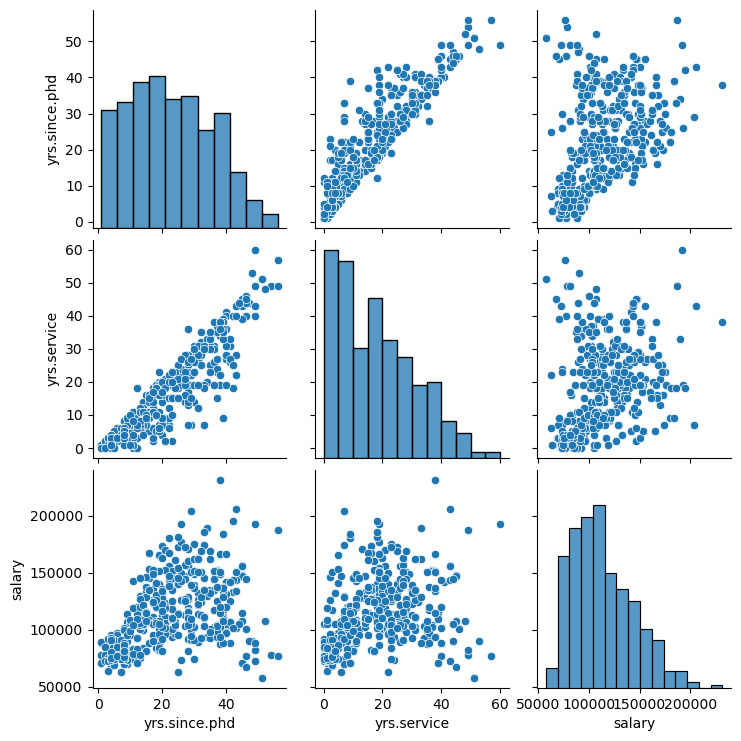

In [3]:
sns.pairplot(salaries)
plt.show()

We see the data that we are working with and the distribution. We can see that Salary is a bit right skewed, however a simple transformation can alleviate this. We also see that we may have some sort of a correlation between Salary and years of service as well as salay and years since phd. Looking at the summary statistics tells us that the range of Salary may be a bit large and that we could possibly do a log transformation.

One thing we are going to look at once again, the difference in salaries between sexes. For our null hypothesis, we can say that there is no differences in the salaries between the sexes. Our alternative to this would be that males make more than females. We want to do a hypothesis test with both a t-test function as well as a permutation method. 

In [4]:
cols =  salaries.select_dtypes(include = "object").columns
salaries[cols] = salaries[cols].astype("category")
salaries["yrs_service_plus"] = salaries["yrs.service"] + 0.1
salaries["salary_inv_sqrt"] = 1/np.sqrt(salaries["salary"])
salaries = salaries.rename(columns = {"yrs.service": "yrs_service",
                                      "yrs.since.phd": "yrs_since_phd"})
print(salaries.dtypes)

rank                category
discipline          category
yrs_since_phd          int64
yrs_service            int64
sex                 category
salary                 int64
yrs_service_plus     float64
salary_inv_sqrt      float64
dtype: object


In [5]:
means = salaries.groupby("sex", observed = True)["salary"].mean()
original_difference = means.iloc[1] - means.iloc[0]
print(means)
print("Original Difference:", original_difference)

sex
Female    101002.410256
Male      115090.418994
Name: salary, dtype: float64
Original Difference: 14088.008738003162


In [6]:
stats = scipy.stats.ttest_ind(salaries["salary"][salaries["sex"] == "Male"], salaries["salary"][salaries["sex"] == "Female"], equal_var = False, alternative = "greater" )
print(f"Statistic:{stats.statistic}",
      f"P-value:{stats.pvalue}",
      f"df:{stats.df}")

Statistic:3.161474091674088 P-value:0.0013318089699819967 df:50.1215153351517


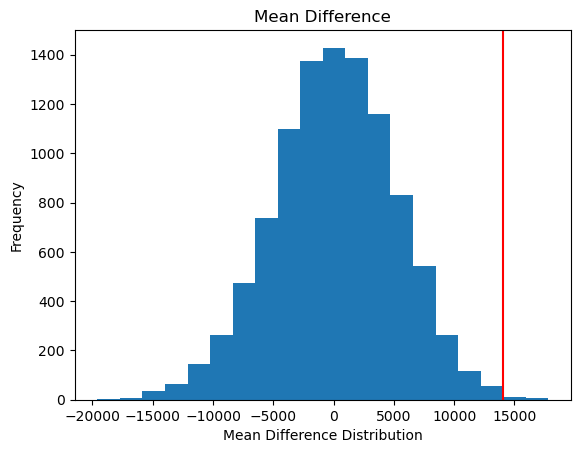

In [7]:
boots = []

for i in range(0, 10000):
    new_salary = np.random.choice(salaries["salary"], salaries.shape[0], replace = False)
    salaries_df = pd.DataFrame({"sex": salaries["sex"], "salary": new_salary})
    new_means = salaries_df.groupby("sex", observed = True)["salary"].mean()
    differences = new_means.iloc[1] - new_means.iloc[0]
    boots.append(differences)


plt.figure()
plt.hist(boots, bins = 20)
plt.axvline(original_difference, color = 'red')
plt.xlabel("Mean Difference Distribution")
plt.ylabel("Frequency")
plt.title("Mean Difference")
plt.show()

In [8]:
pvalue = original_difference < boots
print(sum(pvalue)/10000)

0.0017


Both tests conclude that we reject the null hypothesis that male and female make the same amount given that the null distribution was true. However, we know that statistical modeling entails much more than just hypothesis testing, especially when we have more features to take account of any variation of data. So, we will begin by building our preliminary model. 

In [9]:
salariesfit = smf.ols("salary~C(sex)+C(rank)+C(discipline)+(yrs_service)+(yrs_since_phd)", data = salaries).fit()
print(salariesfit.summary())

                            OLS Regression Results                            
Dep. Variable:                 salary   R-squared:                       0.455
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     54.20
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           1.79e-48
Time:                        02:12:10   Log-Likelihood:                -4538.9
No. Observations:                 397   AIC:                             9092.
Df Residuals:                     390   BIC:                             9120.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            7.886e+04   4

In [10]:
print(anova_lm(salariesfit, type = 2))

                  df        sum_sq       mean_sq           F        PR(>F)
C(sex)           1.0  6.980015e+09  6.980015e+09   13.740441  2.402632e-04
C(rank)          2.0  1.370926e+11  6.854628e+10  134.936127  2.903516e-45
C(discipline)    1.0  1.828318e+10  1.828318e+10   35.991185  4.528311e-09
yrs_service      1.0  3.244823e+08  3.244823e+08    0.638757  4.246479e-01
yrs_since_phd    1.0  2.504061e+09  2.504061e+09    4.929345  2.697855e-02
Residual       390.0  1.981163e+11  5.079906e+08         NaN           NaN


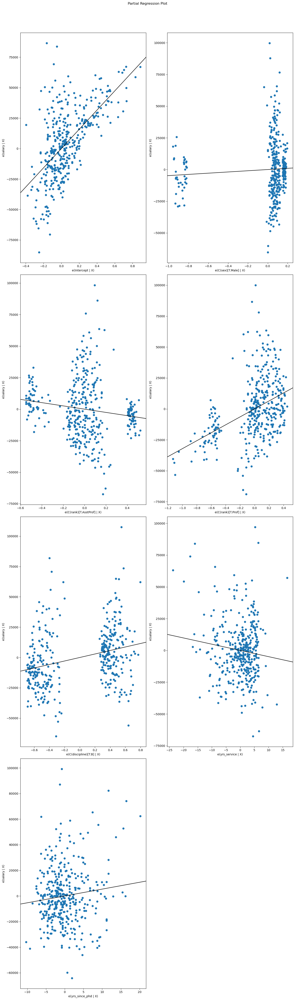

In [11]:
fig = sm.graphics.plot_partregress_grid(salariesfit, fig = plt.figure(figsize = (14, 48)))
plt.show()

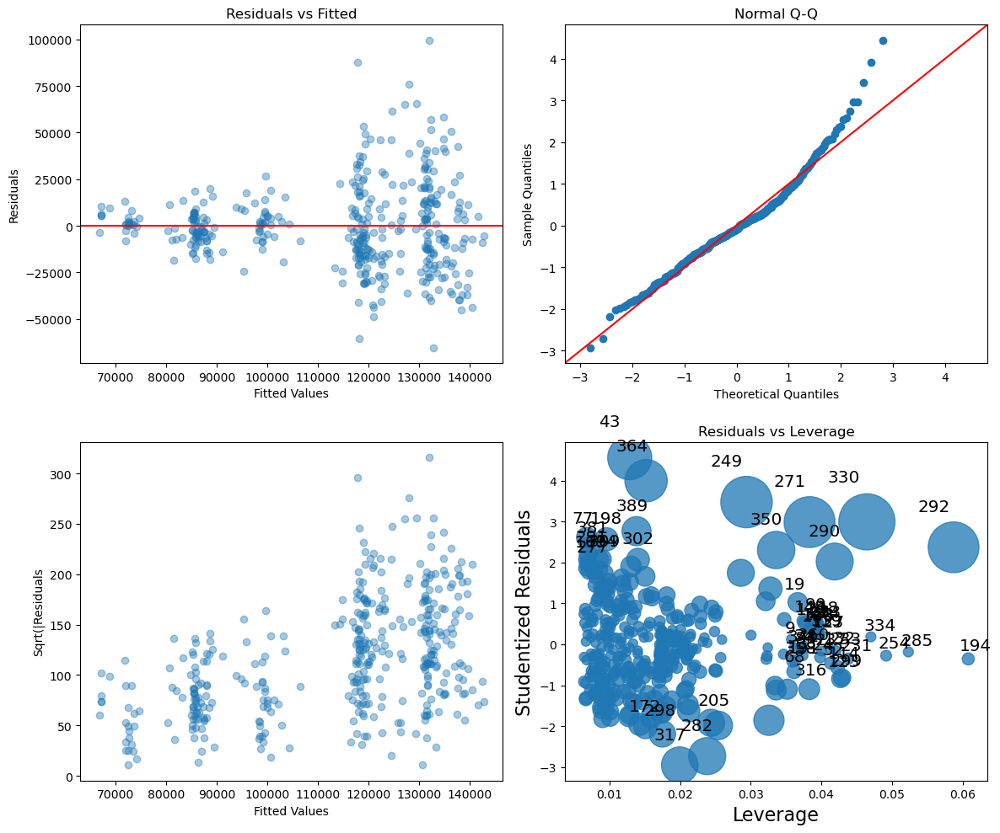

In [12]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(salariesfit.fittedvalues, salariesfit.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salariesfit.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salariesfit.fittedvalues, np.sqrt(np.abs(salariesfit.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
sm.graphics.influence_plot(salariesfit, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

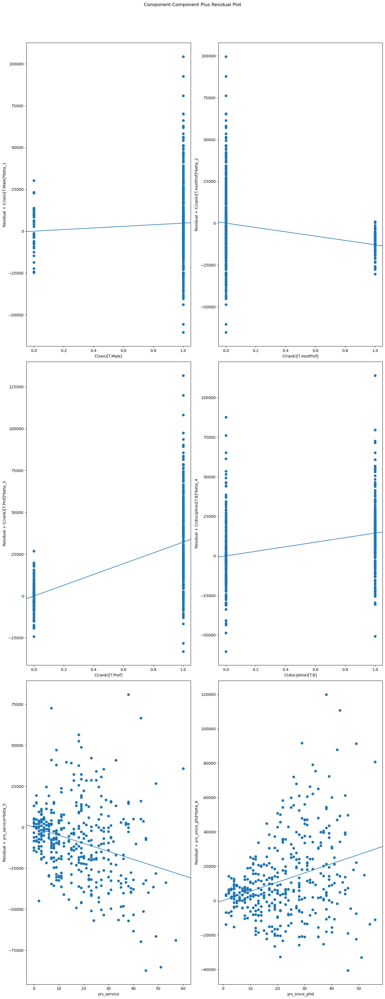

<F test: F=4.383629742737657, p=0.0017736624248677782, df_denom=386, df_num=4>
<F test: F=832.1924240464535, p=5.390550405446339e-142, df_denom=393, df_num=2>


In [13]:
fig = sm.graphics.plot_ccpr_grid(salariesfit, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salariesfit, power = [2, 3], test_type = 'exog', use_f = True))
print(linear_reset(salariesfit, power = [2, 3], test_type = 'fitted', use_f = True))

In [14]:
salariesbp = bptest(salariesfit.resid, salariesfit.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salariesbp):
    print(f"{stat}:{score}")

BP statistics:65.05461165898144
BP p-value:4.204594008352198e-12
f-value:12.73869108098488
f p-value:3.8116505941127605e-13


In [15]:
X = salariesfit.model.exog
vif = pd.DataFrame({"Variables": salariesfit.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

   Variables       VIF
0  Intercept  19.46223


In [16]:
rstudent = OLSInfluence(salariesfit).resid_studentized_external
df = salariesfit.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
43,4.558843,0.000007,0.002737
364,3.997249,0.000077,0.030427
249,3.475788,0.000567,0.224949
269,-0.698826,0.485077,1.000000
268,-1.332820,0.183369,1.000000
267,-0.627683,0.530579,1.000000
266,1.170903,0.242353,1.000000
265,0.641679,0.521459,1.000000
264,-0.867657,0.386115,1.000000
263,0.391198,0.695864,1.000000


In [17]:
print(salariesfit.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
330  0.046459  0.061054        2.961704
249  0.029414  0.050858        3.427437
271  0.038345  0.049773        2.955987
292  0.058737  0.049513        2.356717
43   0.012872  0.036845        4.447439
364  0.015187  0.033898        3.922634
350  0.033612  0.026079        2.290992
282  0.023839  0.025605       -2.709106
290  0.041899  0.025378        2.015508
317  0.019960  0.024880       -2.924262


Looking at several of our diagnostics, we fail to meet almost all of our assumptions save multicollinearity. The graph also clearly show heteroscedasticity. We also see that going from female to male makes no difference, but the ANOVA tells us that sex does matter and years of service does not. However, we can't truly trust it if the assumptions are not met. 

We can try to do a multivariate power transformation to see if this will fix any of our issues. We will also add in interactions with all the variables to weed out what is important and what is not. 

In [18]:
df = salaries.copy()
df = df.drop(columns = ['yrs_service', 'salary_inv_sqrt'])
mpt = MultivariatePowerTransform(family = 'box-cox')
mpt.fit_transform(Y = df.select_dtypes(include = ['int64', 'float64']))
labels = df.select_dtypes(include = ['int64', 'float64']).columns

for lab, score in zip(labels, mpt.lambdas_):
    print(f"{lab}:{score}")

yrs_since_phd:0.5852696937057341
salary:-0.24986906433264486
yrs_service_plus:0.5239529274340031


We have several transformations for our continuous covariates that may deem to be un-interpretable, however we will try to and run these first and see what our diagnostics look like. We can then substitute these for transformations that are a bit more interpretable for any potential audience. 

In [19]:
salarypwr = smf.ols("I(salary**-0.25)~C(rank)*C(discipline)*C(sex)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)", data = salaries).fit()
print(salarypwr.summary())

                            OLS Regression Results                            
Dep. Variable:     I(salary ** -0.25)   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     12.23
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           9.08e-50
Time:                        02:12:16   Log-Likelihood:                 1868.2
No. Observations:                 397   AIC:                            -3640.
Df Residuals:                     349   BIC:                            -3449.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [20]:
print(anova_lm(salarypwr, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.343058e-03   
C(discipline)                                         1.0  3.233068e-04   
C(sex)                                                1.0  1.133613e-05   
C(rank):C(discipline)                                 2.0  2.356774e-05   
C(rank):C(sex)                                        2.0  4.930984e-06   
C(discipline):C(sex)                                  1.0  8.834408e-06   
C(rank):C(discipline):C(sex)                          2.0  3.478592e-06   
I(yrs_service_plus ** 0.52)                           1.0  1.442564e-05   
C(rank):I(yrs_service_plus ** 0.52)                   2.0  1.123814e-05   
C(discipline):I(yrs_service_plus ** 0.52)             1.0  3.379676e-05   
C(sex):I(yrs_service_plus ** 0.52)                    1.0  9.848361e-06   
C(rank):C(discipline):I(yrs_service_plus ** 0.52)     2.0  1.655980e-06   
C(rank):C(sex):I(yrs_serv

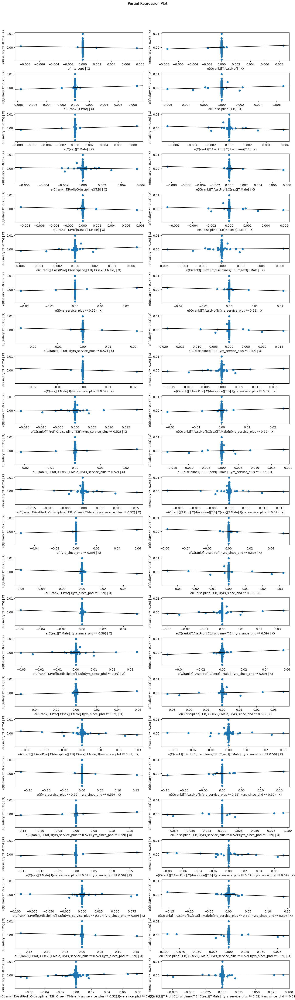

In [21]:
fig = sm.graphics.plot_partregress_grid(salarypwr, fig = plt.figure(figsize = (14, 48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


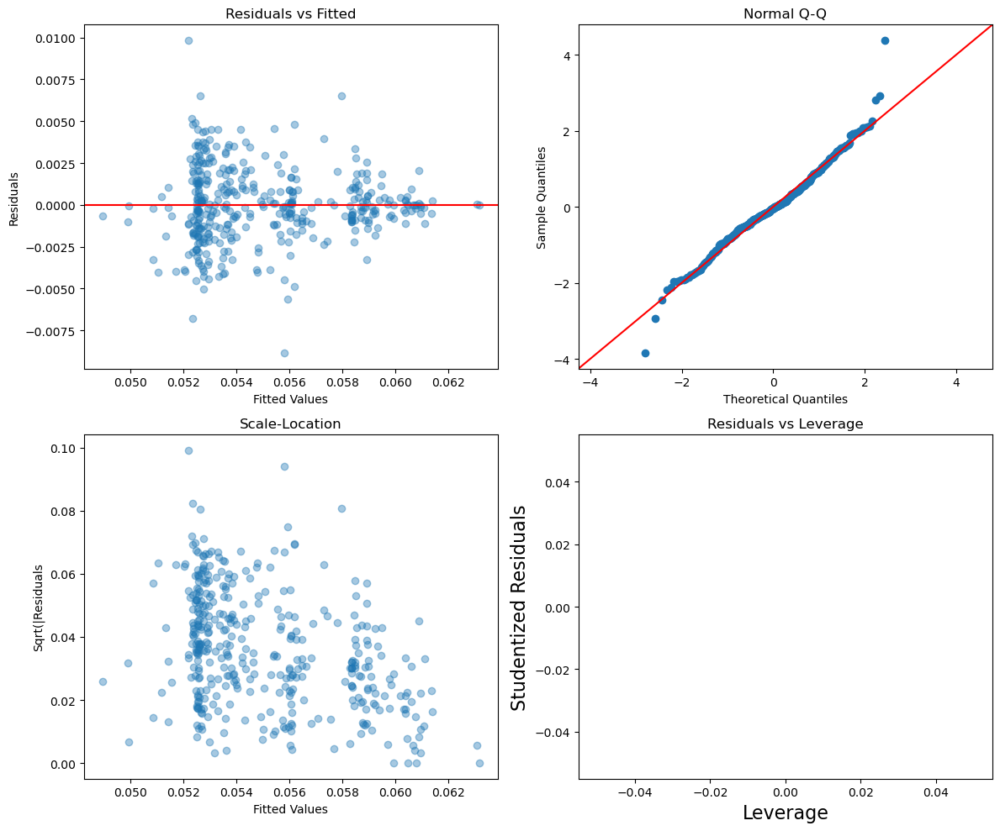

In [22]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarypwr.fittedvalues, salarypwr.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarypwr.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarypwr.fittedvalues, np.sqrt(np.abs(salarypwr.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarypwr, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

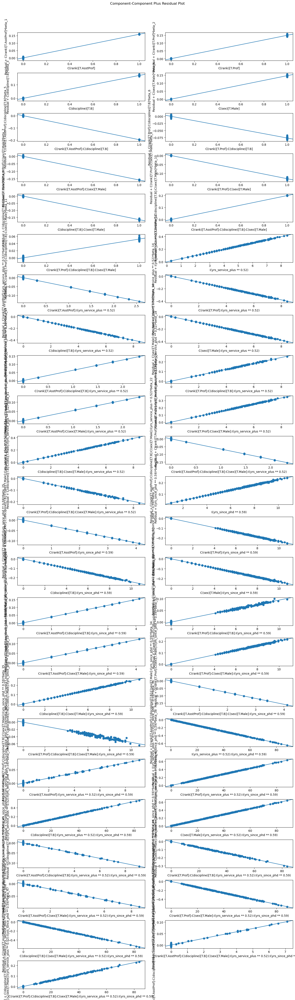

<F test: F=np.float64(13.028057456055194), p=1.8730677264972889e-56, df_denom=299, df_num=64>
<F test: F=1.8507176160750127, p=0.15867193858240186, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 64
  warnings.warn('covariance of constraints does not have full '


In [23]:
fig = sm.graphics.plot_ccpr_grid(salarypwr, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarypwr, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarypwr, power = [2,3], test_type = 'fitted', use_f = True))

In [24]:
salarypwrbp = bptest(salarypwr.resid, salarypwr.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarypwrbp):
    print(f"{stat}:{score}")

BP statistic:68.83454166138478
BP p-value:0.02059207641504212
f-value:1.557546880593014
f p-value:0.014477149295028729


In [25]:
X = salarypwr.model.exog
vif = pd.DataFrame({"Variable": salarypwr.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  2.948881e+06
1                                 C(rank)[T.AsstProf]  4.144626e+05
2                                     C(rank)[T.Prof]  6.530365e+05
3                                  C(discipline)[T.B]  9.302029e+05
4                                      C(sex)[T.Male]  2.614186e+05
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  3.673588e+05
6                  C(rank)[T.Prof]:C(discipline)[T.B]  8.940809e+05
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  3.586221e+05
8                      C(rank)[T.Prof]:C(sex)[T.Male]  6.932093e+05
9                   C(discipline)[T.B]:C(sex)[T.Male]  9.380637e+05
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  3.298505e+05
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  8.605818e+05
12                        I(yrs_service_plus ** 0.52)  1.166680e+06
13    C(rank)[T.AsstProf]:I(yrs_service_plus ** 

In [26]:
rstudent = OLSInfluence(salarypwr).resid_studentized_external
df = salarypwr.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,4.498941,0.000009,0.003698
364,-3.925572,0.000104,0.041388
0,-0.372637,0.709645,1.000000
269,-0.338001,0.735566,1.000000
268,0.672870,0.501475,1.000000
267,-0.057392,0.954266,1.000000
266,-1.954567,0.051432,1.000000
265,-0.617480,0.537321,1.000000
264,0.877453,0.380844,1.000000
263,-0.342034,0.732531,1.000000


In [27]:
print(salarypwr.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:888: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_internal * np.sqrt(hii / (1 - hii))


     hat_diag   cooks_d  standard_resid
132  1.000000  5.045137        0.000007
334  0.984178  4.724531        1.909396
52   0.997673  2.726849        0.552479
90   0.984732  0.410122       -0.552479
114  0.969372  0.285383        0.657884
218  0.737025  0.225345       -1.964537
63   0.822793  0.121914       -1.122643
35   0.950033  0.120905       -0.552479
19   0.768478  0.056719       -0.905662
123  1.000000  0.053155        0.000003


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:917: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_external * np.sqrt(hii / (1 - hii))


We see that our diagnostics look a lot better and that we do meet linearity when we test against the fitted values using the linear reset test. We also see that our variance is still heteroscedastic, but it is far more constant than before. Of course we see some multi-collinearity which comes with interactions, but we also see many variables that are not significant. We can look to see about dropping some of these variables and comparing our sub-model with our current model to see if the more complex one is even necessary. We will eliminate sex, ironically, as that seems to be insignificant all across the board, both the main effects and it's interactions. The only instance where sex seems to matter is through it's non-linear relationship with years of service and years since phD. We will remove all instances of sex, entirely, from the model. 

In [28]:
salarypwr_mod = smf.ols("I(salary**-0.25)~C(rank)+C(discipline)+I(yrs_service_plus**0.52)+I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)+C(discipline)*I(yrs_since_phd**0.59)+I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)+C(rank)*C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)", data = salaries).fit()
print(salarypwr_mod.summary())
#salary_inv_sqrt~C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)+C(discipline)*np.sqrt(yrs_since_phd)+np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)

                            OLS Regression Results                            
Dep. Variable:     I(salary ** -0.25)   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.576
Method:                 Least Squares   F-statistic:                     24.39
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           1.81e-60
Time:                        02:12:35   Log-Likelihood:                 1857.1
No. Observations:                 397   AIC:                            -3666.
Df Residuals:                     373   BIC:                            -3571.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

In [29]:
print(anova_lm(salarypwr_mod, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.343058e-03   
C(discipline)                                         1.0  3.233068e-04   
C(rank):C(discipline)                                 2.0  2.405346e-05   
I(yrs_service_plus ** 0.52)                           1.0  1.253454e-05   
C(discipline):I(yrs_service_plus ** 0.52)             1.0  3.252252e-05   
C(rank):I(yrs_service_plus ** 0.52)                   2.0  1.175067e-05   
C(rank):C(discipline):I(yrs_service_plus ** 0.52)     2.0  7.207766e-07   
I(yrs_since_phd ** 0.59)                              1.0  1.541460e-05   
C(discipline):I(yrs_since_phd ** 0.59)                1.0  4.557311e-05   
C(rank):I(yrs_since_phd ** 0.59)                      2.0  3.643217e-06   
C(rank):C(discipline):I(yrs_since_phd ** 0.59)        2.0  1.014725e-06   
I(yrs_service_plus ** 0.52):I(yrs_since_phd ** ...    1.0  7.578204e-05   
C(discipline):I(yrs_servi

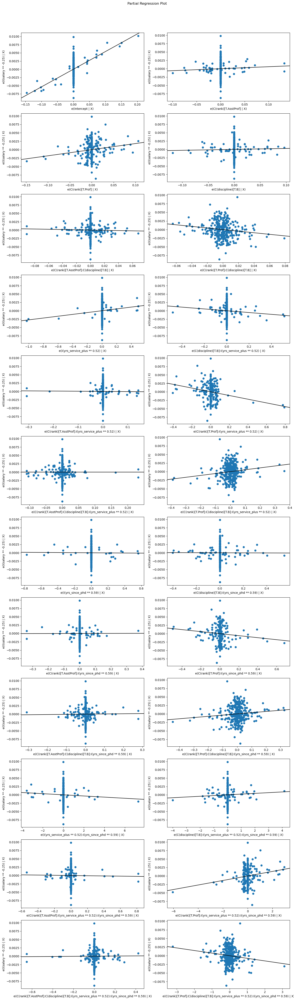

In [30]:
fig = sm.graphics.plot_partregress_grid(salarypwr_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

In [31]:
print(anova_lm(salarypwr_mod, salarypwr))

   df_resid       ssr  df_diff   ss_diff         F    Pr(>F)
0     373.0  0.002010      0.0       NaN       NaN       NaN
1     349.0  0.001901     24.0  0.000109  0.834351  0.692322


We see that our ANOVA concludes that there is no difference between our two models so we will go with the smaller one and do further analysis and diagnostics to make sure that assumptions are met even better or worse. Not only that, the simpler model seems to have a better adjusted R-2.

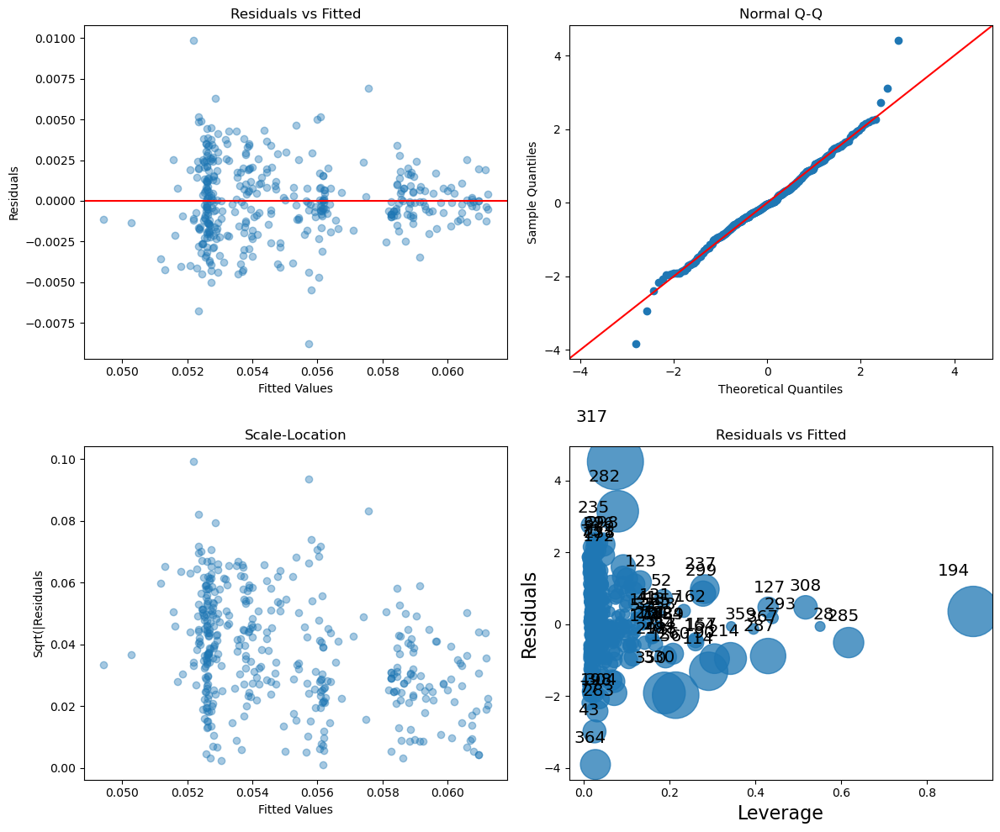

In [32]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarypwr_mod.fittedvalues, salarypwr_mod.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarypwr_mod.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarypwr_mod.fittedvalues, np.sqrt(np.abs(salarypwr_mod.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarypwr_mod, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_xlabel("Leverage")
axes[1,1].set_ylabel("Residuals")
axes[1,1].set_title("Residuals vs Fitted")
plt.tight_layout()
plt.show()

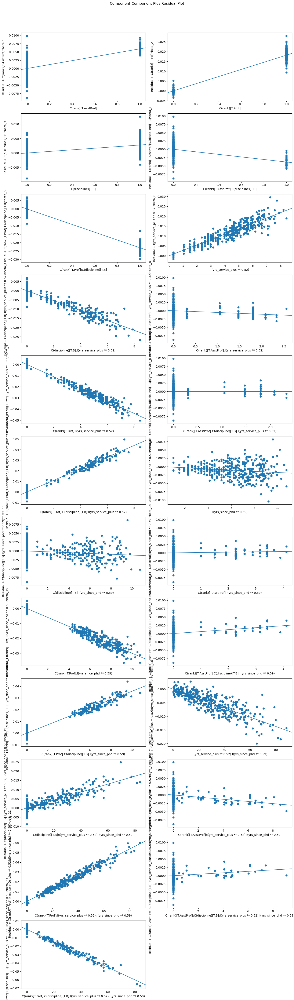

<F test: F=np.float64(0.9626192868347727), p=0.5328562493746183, df_denom=337, df_num=35>
<F test: F=1.941186022071033, p=0.1449887033888288, df_denom=371, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 36, but rank is 35
  warnings.warn('covariance of constraints does not have full '


In [33]:
fig = sm.graphics.plot_ccpr_grid(salarypwr_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarypwr_mod, power = [2, 3], test_type = 'exog', use_f = True))
print(linear_reset(salarypwr_mod, power = [2, 3], test_type = 'fitted', use_f = True))

In [34]:
salarypwrmodbp = bptest(salarypwr_mod.fittedvalues, salarypwr_mod.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarypwrmodbp):
    print(f"{stat}:{score}")

BP statistic:396.9886683593746
BP p-value:7.401351761894332e-70
f-value:568154.3203705018
f p-value:0.0


In [35]:
X = salarypwr_mod.model.exog
vif = pd.DataFrame({"Variable": salarypwr_mod.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})

print(vif[vif["VIF"] >= 10])

                                             Variable          VIF
0                                           Intercept  1816.891040
1                                 C(rank)[T.AsstProf]   519.849934
2                                     C(rank)[T.Prof]   549.900244
3                                  C(discipline)[T.B]   773.972239
4              C(rank)[T.AsstProf]:C(discipline)[T.B]   520.570770
5                  C(rank)[T.Prof]:C(discipline)[T.B]  1049.186734
6                         I(yrs_service_plus ** 0.52)   351.462988
7      C(discipline)[T.B]:I(yrs_service_plus ** 0.52)  1117.166280
8     C(rank)[T.AsstProf]:I(yrs_service_plus ** 0.52)   372.952397
9         C(rank)[T.Prof]:I(yrs_service_plus ** 0.52)   910.005470
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:I(yrs_s...   332.527752
11  C(rank)[T.Prof]:C(discipline)[T.B]:I(yrs_servi...  1572.951690
12                           I(yrs_since_phd ** 0.59)   621.955264
13        C(discipline)[T.B]:I(yrs_since_phd ** 0.59)  1749.01

In [36]:
rstudent = OLSInfluence(salarypwr_mod).resid_studentized_external
df = salarypwr_mod.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
317,4.519063,0.000008,0.003315
364,-3.900782,0.000114,0.045148
282,3.140163,0.001823,0.723812
268,0.751872,0.452602,1.000000
267,-0.011582,0.990765,1.000000
266,-1.925542,0.054922,1.000000
265,-0.683618,0.494641,1.000000
264,0.842050,0.400299,1.000000
263,-0.420878,0.674086,1.000000
262,0.033809,0.973048,1.000000


In [37]:
print(salarypwr_mod.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
317  0.073848  0.064491        4.405814
194  0.907680  0.051713        0.355292
330  0.214246  0.043876       -1.965193
350  0.187959  0.035007       -1.905192
282  0.079358  0.034594        3.103517
114  0.291213  0.029258       -1.307321
287  0.429744  0.024580       -0.884763
214  0.342090  0.019663       -0.952674
285  0.617420  0.017576       -0.511252
364  0.027273  0.017123       -3.828507


Our residual plots look good, there may be slight clustering, however, our assumption for linearity has been met both through the fitted values and the regressors. We violate our assumption of homoscedasticity even further, however. We do not see any influence points that cause us any concern and our qq-norm plot looks good with a few deviances from the tails. Of course, we have multi-collinearity due to interaction terms. 

Now that we can go with our simpler power-model. What if we try building a model with exponent values that are a bit more interpretable? 

In [38]:
salarysqrt = smf.ols("salary_inv_sqrt~C(rank)*C(discipline)*C(sex)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)", data = salaries).fit()
print(salarysqrt.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_inv_sqrt   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.586
Method:                 Least Squares   F-statistic:                     12.93
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           3.22e-52
Time:                        02:12:47   Log-Likelihood:                 2751.0
No. Observations:                 397   AIC:                            -5406.
Df Residuals:                     349   BIC:                            -5215.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

In [39]:
print(anova_lm(salarysqrt, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.901812e-05   
C(discipline)                                         1.0  4.066792e-06   
C(sex)                                                1.0  1.450014e-07   
C(rank):C(discipline)                                 2.0  3.681650e-07   
C(rank):C(sex)                                        2.0  7.535188e-08   
C(discipline):C(sex)                                  1.0  1.131657e-07   
C(rank):C(discipline):C(sex)                          2.0  4.956094e-08   
np.sqrt(yrs_service)                                  1.0  2.060448e-07   
C(rank):np.sqrt(yrs_service)                          2.0  1.465893e-07   
C(discipline):np.sqrt(yrs_service)                    1.0  3.890810e-07   
C(sex):np.sqrt(yrs_service)                           1.0  1.207951e-07   
C(rank):C(discipline):np.sqrt(yrs_service)            2.0  1.295918e-08   
C(rank):C(sex):np.sqrt(yr

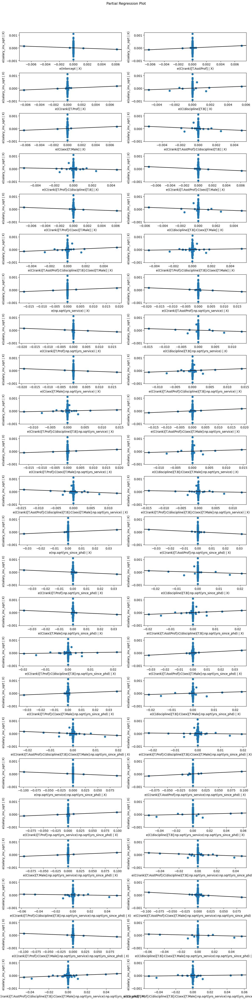

In [40]:
fig = sm.graphics.plot_partregress_grid(salarysqrt, fig = plt.figure(figsize = (12,48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


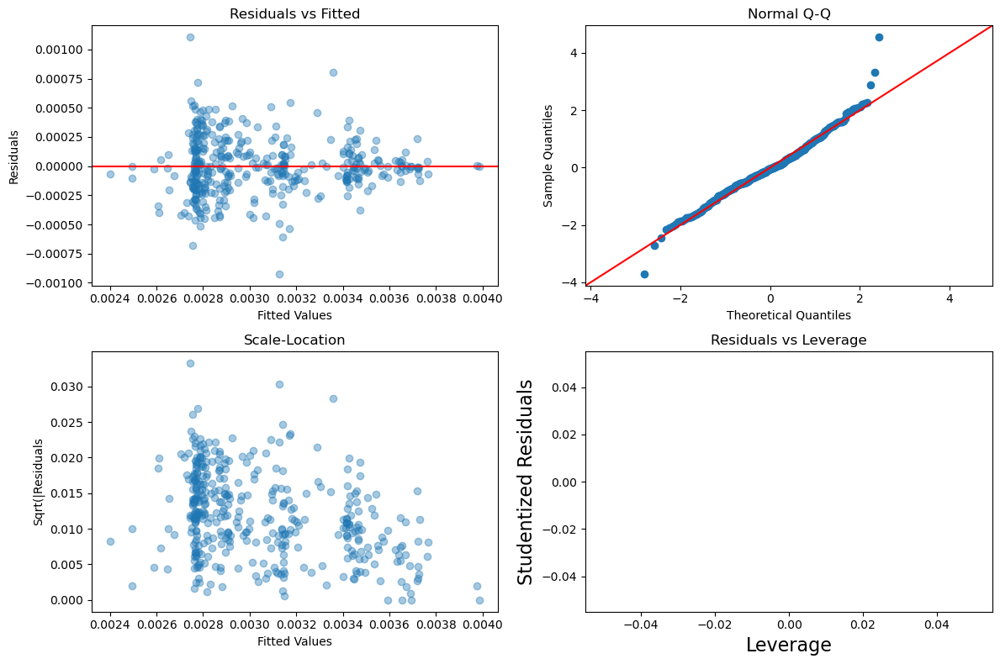

In [41]:
fig, axes = plt.subplots(2,2, figsize = (12,8))

axes[0,0].scatter(salarysqrt.fittedvalues, salarysqrt.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.graphics.qqplot(salarysqrt.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarysqrt.fittedvalues, np.sqrt(np.abs(salarysqrt.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarysqrt, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

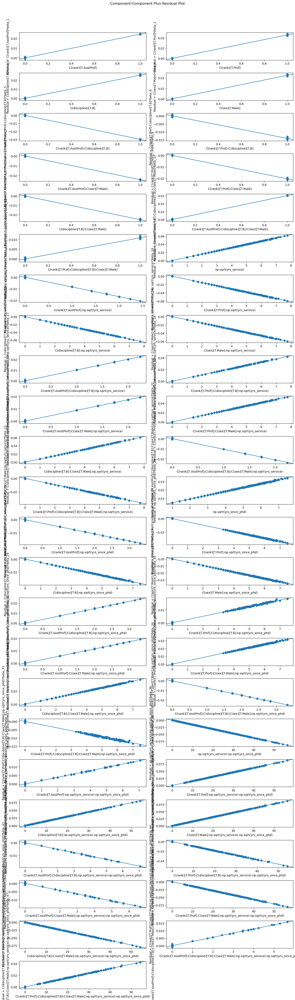

<F test: F=np.float64(4.2967644639708364), p=3.5510072335447996e-18, df_denom=299, df_num=65>
<F test: F=1.6006375829764217, p=0.20325391285017072, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 65
  warnings.warn('covariance of constraints does not have full '


In [42]:
fig = sm.graphics.plot_ccpr_grid(salarysqrt, fig = plt.figure(figsize = (14,48)))
plt.show()

print(linear_reset(salarysqrt, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarysqrt, power = [2,3], test_type = 'fitted', use_f = True))

In [43]:
salarysqrtbp = bptest(salarysqrt.resid, salarysqrt.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarysqrtbp):
    print(f"{stat}:{score}")

BP statistic:67.46216381742214
BP p-value:0.026748584465536383
f-value:1.5201363712193163
f p-value:0.019639592137480955


In [44]:
X = salarysqrt.model.exog
vif = pd.DataFrame({"Variable": salarysqrt.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  4.429195e+06
1                                 C(rank)[T.AsstProf]  6.224689e+05
2                                     C(rank)[T.Prof]  9.808104e+05
3                                  C(discipline)[T.B]  1.391503e+06
4                                      C(sex)[T.Male]  3.926524e+05
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  5.491737e+05
6                  C(rank)[T.Prof]:C(discipline)[T.B]  1.337261e+06
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  5.384150e+05
8                      C(rank)[T.Prof]:C(sex)[T.Male]  1.041146e+06
9                   C(discipline)[T.B]:C(sex)[T.Male]  1.403263e+06
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  4.929432e+05
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  1.287148e+06
12                               np.sqrt(yrs_service)  1.657100e+06
13           C(rank)[T.AsstProf]:np.sqrt(yrs_ser

In [45]:
rstudent = OLSInfluence(salarysqrt).resid_studentized_external
df = salarysqrt.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent),df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,4.674962,0.000004,0.001670
364,-3.771801,0.000190,0.075559
282,3.361295,0.000862,0.342094
0,-0.376749,0.706589,1.000000
269,-0.374850,0.707999,1.000000
268,0.654735,0.513070,1.000000
267,-0.062762,0.949992,1.000000
266,-1.984427,0.047991,1.000000
265,-0.658906,0.510391,1.000000
264,0.846530,0.397837,1.000000


In [46]:
print(salarysqrt.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:888: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_internal * np.sqrt(hii / (1 - hii))


     hat_diag   cooks_d  standard_resid
334  0.983699  5.298800        2.052960
52   0.998401  5.106082        0.626597
132  1.000000  4.083851        0.000007
90   0.982943  0.471376       -0.626597
114  0.976883  0.426091        0.695686
218  0.735853  0.258980       -2.112421
35   0.964988  0.225448       -0.626597
63   0.823729  0.141580       -1.205921
19   0.756334  0.057929       -0.946478
316  0.337967  0.053380        2.240339


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:917: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_external * np.sqrt(hii / (1 - hii))


We see that this model performs pretty similarly to the power-model with a better R-squared. This makes it a more interpretable. Now, we will eliminate the variables that seem insignificant and compare a sub-model to this one. Once again, sex seems to be the odd man out, which contradicts our t-test and permutation we did at the very beginning saying that there was a difference in pay between sexes. 

In [47]:
salarysqrt_mod = smf.ols("salary_inv_sqrt~C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)+C(discipline)*np.sqrt(yrs_since_phd)+np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)", data = salaries).fit()
print(salarysqrt_mod.summary())


                            OLS Regression Results                            
Dep. Variable:        salary_inv_sqrt   R-squared:                       0.612
Model:                            OLS   Adj. R-squared:                  0.589
Method:                 Least Squares   F-statistic:                     25.63
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           8.19e-63
Time:                        02:13:07   Log-Likelihood:                 2738.9
No. Observations:                 397   AIC:                            -5430.
Df Residuals:                     373   BIC:                            -5334.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------

In [48]:
print(anova_lm(salarysqrt_mod, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.901812e-05   
C(discipline)                                         1.0  4.066792e-06   
C(rank):C(discipline)                                 2.0  3.784043e-07   
np.sqrt(yrs_service)                                  1.0  1.836757e-07   
C(discipline):np.sqrt(yrs_service)                    1.0  3.814202e-07   
C(rank):np.sqrt(yrs_service)                          2.0  1.513421e-07   
C(rank):C(discipline):np.sqrt(yrs_service)            2.0  5.017546e-09   
np.sqrt(yrs_since_phd)                                1.0  1.548506e-07   
C(discipline):np.sqrt(yrs_since_phd)                  1.0  5.146487e-07   
C(rank):np.sqrt(yrs_since_phd)                        2.0  4.560666e-08   
C(rank):C(discipline):np.sqrt(yrs_since_phd)          2.0  1.236979e-08   
np.sqrt(yrs_service):np.sqrt(yrs_since_phd)           1.0  8.988158e-07   
C(discipline):np.sqrt(yrs

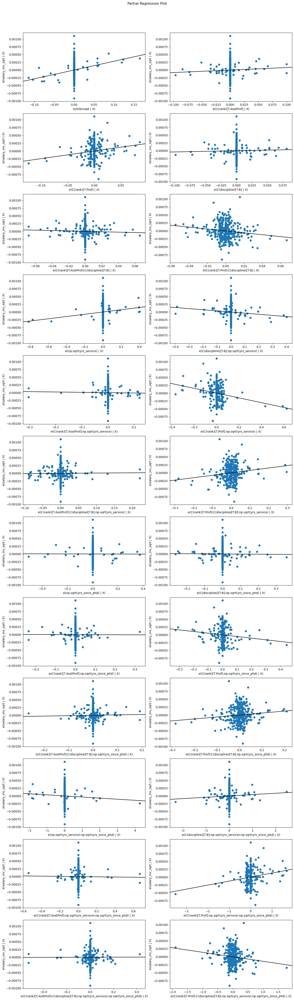

In [49]:
fig = sm.graphics.plot_partregress_grid(salarysqrt_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

In [50]:
print(anova_lm(salarysqrt_mod, salarysqrt))

   df_resid       ssr  df_diff   ss_diff         F    Pr(>F)
0     373.0  0.000024      0.0       NaN       NaN       NaN
1     349.0  0.000022     24.0  0.000001  0.910368  0.588056


Our ANOVA tells us that the sub-model is the way to go, so we shall proceed.

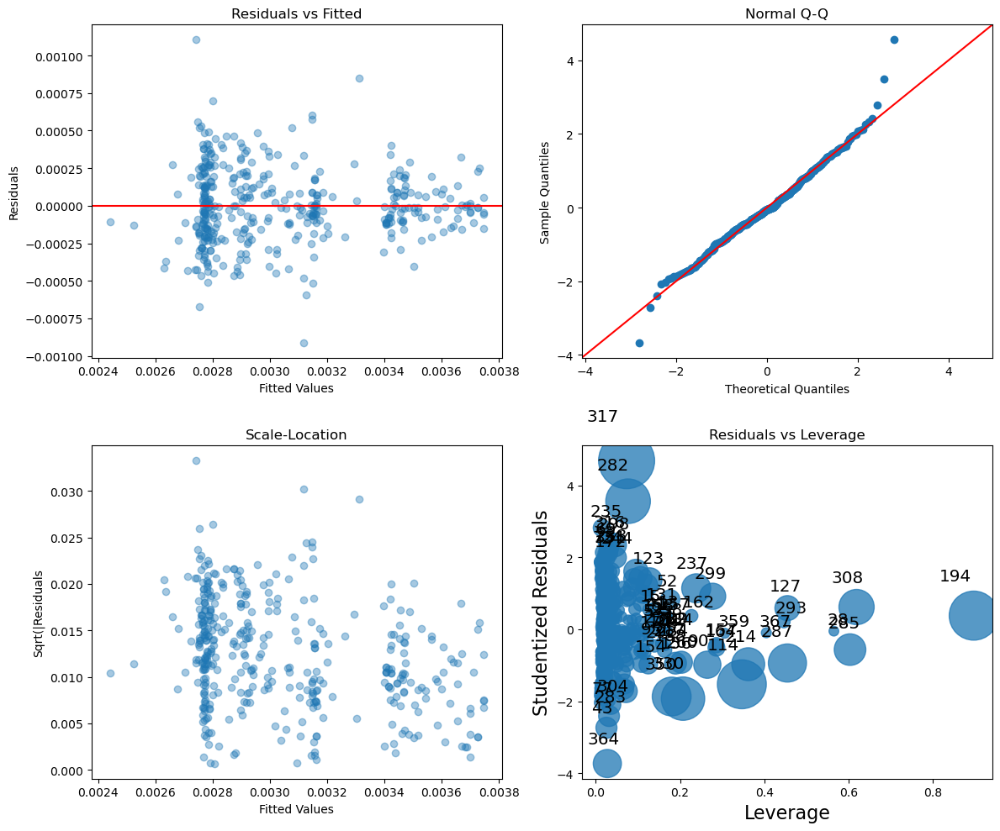

In [51]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarysqrt_mod.fittedvalues, salarysqrt_mod.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarysqrt_mod.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarysqrt_mod.fittedvalues, np.sqrt(np.abs(salarysqrt_mod.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarysqrt_mod, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

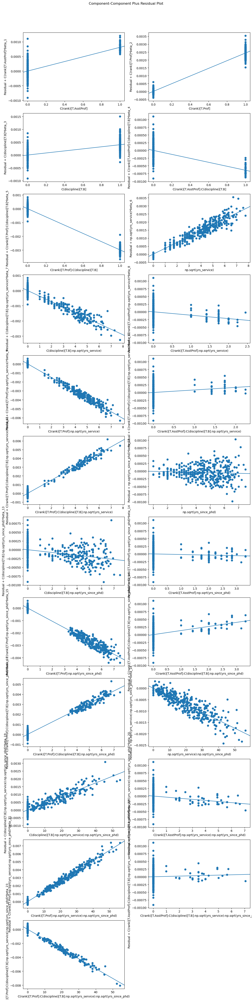

<F test: F=np.float64(1.0287493928833733), p=0.4281480938593314, df_denom=337, df_num=35>
<F test: F=1.4707992768408706, p=0.23107821051385669, df_denom=371, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 36, but rank is 35
  warnings.warn('covariance of constraints does not have full '


In [52]:
fig = sm.graphics.plot_ccpr_grid(salarysqrt_mod, fig = plt.figure(figsize = (12,48)))
plt.show()

print(linear_reset(salarysqrt_mod, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarysqrt_mod, power = [2,3], test_type = 'fitted', use_f = True))

In [53]:
salarysqrtmodbp = bptest(salarysqrt_mod.resid, salarysqrt_mod.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "p f-value"]

for stat, score in zip(labels, salarysqrtmodbp):
    print(f"{stat}:{score}")

BP statistics:59.45835674667205
BP p-value:4.573596312382288e-05
f-value:2.8567125181369253
p f-value:1.8320711774436653e-05


In [54]:
X = salarysqrt_mod.model.exog
vif = pd.DataFrame({"Variable": salarysqrt_mod.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable          VIF
0                                           Intercept  2795.257772
1                                 C(rank)[T.AsstProf]   671.457867
2                                     C(rank)[T.Prof]   825.311979
3                                  C(discipline)[T.B]  1160.522583
4              C(rank)[T.AsstProf]:C(discipline)[T.B]   677.749109
5                  C(rank)[T.Prof]:C(discipline)[T.B]  1555.428781
6                                np.sqrt(yrs_service)   445.458581
7             C(discipline)[T.B]:np.sqrt(yrs_service)  1474.200110
8            C(rank)[T.AsstProf]:np.sqrt(yrs_service)   358.040431
9                C(rank)[T.Prof]:np.sqrt(yrs_service)  1167.656576
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt...   329.938426
11  C(rank)[T.Prof]:C(discipline)[T.B]:np.sqrt(yrs...  2095.473210
12                             np.sqrt(yrs_since_phd)   622.710833
13          C(discipline)[T.B]:np.sqrt(yrs_since_phd)  2230.66

In [55]:
rstudent = OLSInfluence(salarysqrt_mod).resid_studentized_external
df = salarysqrt_mod.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
317,4.683621,0.000004,0.001570
364,-3.731765,0.000220,0.087243
282,3.558278,0.000421,0.167320
268,0.748598,0.454572,1.000000
267,0.002140,0.998294,1.000000
266,-1.945300,0.052490,1.000000
265,-0.728172,0.466965,1.000000
264,0.801982,0.423074,1.000000
263,-0.459719,0.645986,1.000000
262,-0.010927,0.991288,1.000000


In [56]:
print(salarysqrt_mod.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
317  0.073031  0.068183        4.557463
194  0.896611  0.051899        0.378981
114  0.346419  0.051485       -1.526841
282  0.076583  0.042426        3.503926
330  0.206865  0.040109       -1.921139
350  0.179935  0.031741       -1.863299
287  0.454532  0.030577       -0.938443
308  0.618563  0.025758        0.617417
214  0.361594  0.022267       -0.971354
285  0.603086  0.020311       -0.566401


This performs very similar to the modified power-model, but even better! In fact this is our best model so far as far as meeting our linear regression assumptions. 

We will try one last model, this time with a log calculation on the response variable, salary, as well as log transformations on the continuous predictor variables. 

In [57]:
salarylog = smf.ols("np.log(salary)~C(rank)*C(discipline)*C(sex)*np.log(yrs_service_plus)*np.log(yrs_since_phd)", data = salaries).fit()
print(salarylog.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(salary)   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.546
Method:                 Least Squares   F-statistic:                     11.15
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           7.83e-46
Time:                        02:13:19   Log-Likelihood:                 153.74
No. Observations:                 397   AIC:                            -211.5
Df Residuals:                     349   BIC:                            -20.25
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [58]:
print(anova_lm(salarylog, type = 3))

                                                       df     sum_sq  \
C(rank)                                               2.0  12.174021   
C(discipline)                                         1.0   1.654867   
C(sex)                                                1.0   0.057625   
C(rank):C(discipline)                                 2.0   0.096166   
C(rank):C(sex)                                        2.0   0.020933   
C(discipline):C(sex)                                  1.0   0.044435   
C(rank):C(discipline):C(sex)                          2.0   0.015876   
np.log(yrs_service_plus)                              1.0   0.020592   
C(rank):np.log(yrs_service_plus)                      2.0   0.107856   
C(discipline):np.log(yrs_service_plus)                1.0   0.090523   
C(sex):np.log(yrs_service_plus)                       1.0   0.052494   
C(rank):C(discipline):np.log(yrs_service_plus)        2.0   0.019137   
C(rank):C(sex):np.log(yrs_service_plus)               2.0   0.03

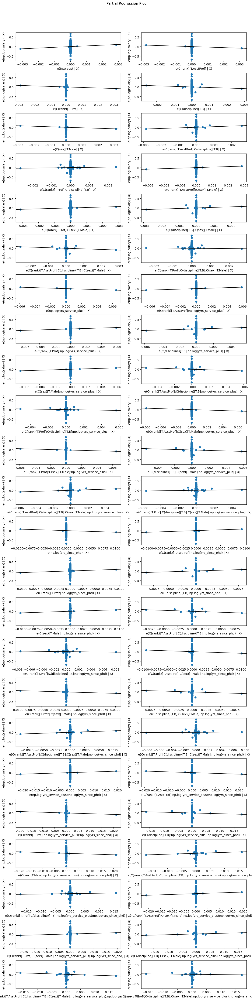

In [59]:
fig = sm.graphics.plot_partregress_grid(salarylog, fig = plt.figure(figsize = (12, 48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


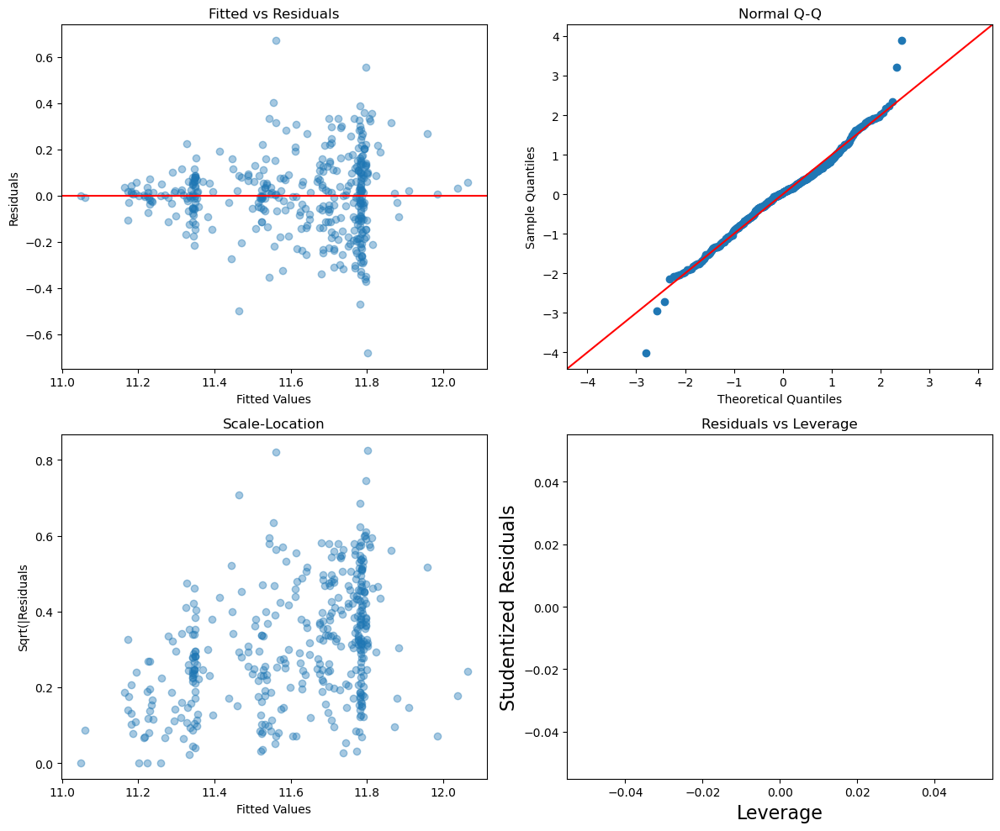

In [60]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarylog.fittedvalues, salarylog.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Fitted vs Residuals")
sm.qqplot(salarylog.get_influence().resid_studentized_internal, line = '45', ax = axes[0, 1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarylog.fittedvalues, np.sqrt(np.abs(salarylog.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarylog, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

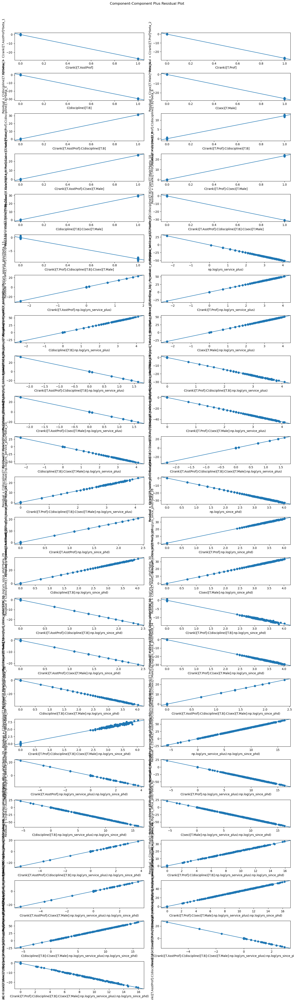

<F test: F=np.float64(49.66232374691572), p=1.681383795684224e-128, df_denom=299, df_num=68>
<F test: F=1.3737465265595574, p=0.2545300164181918, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 68
  warnings.warn('covariance of constraints does not have full '


In [61]:
fig = sm.graphics.plot_ccpr_grid(salarylog, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarylog, power = [2, 3], test_type = 'exog', use_f = True))
print(linear_reset(salarylog, power = [2, 3], test_type = 'fitted', use_f = True))

In [62]:
salarylogbp = bptest(salarylog.resid, salarylog.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarylogbp):
    print(f"{stat}:{score}")

BP statistic:73.32236654873141
BP p-value:0.008325995414668485
f-value:1.6820982255639982
f p-value:0.004974788220996804


In [63]:
X = salarylog.model.exog
vif = pd.DataFrame({"Variable": salarylog.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  2.195500e+07
1                                 C(rank)[T.AsstProf]  3.080550e+06
2                                     C(rank)[T.Prof]  4.860791e+06
3                                  C(discipline)[T.B]  5.988231e+06
4                                      C(sex)[T.Male]  1.945890e+06
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  2.334383e+06
6                  C(rank)[T.Prof]:C(discipline)[T.B]  5.801075e+06
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  2.662020e+06
8                      C(rank)[T.Prof]:C(sex)[T.Male]  5.158585e+06
9                   C(discipline)[T.B]:C(sex)[T.Male]  6.037550e+06
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  2.093621e+06
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  5.582797e+06
12                           np.log(yrs_service_plus)  7.650986e+06
13       C(rank)[T.AsstProf]:np.log(yrs_service_

In [64]:
rstudent = OLSInfluence(salarylog).resid_studentized_external
df = salarylog.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,-4.105191,0.000050,0.019989
364,3.974598,0.000086,0.034021
43,3.254644,0.001246,0.494829
0,0.369486,0.711990,1.000000
269,0.515638,0.606434,1.000000
268,-0.789878,0.430136,1.000000
267,0.041282,0.967094,1.000000
266,1.838888,0.066781,1.000000
265,0.723974,0.469567,1.000000
264,-0.792004,0.428897,1.000000


In [65]:
print(salarylog.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:888: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_internal * np.sqrt(hii / (1 - hii))


     hat_diag   cooks_d  standard_resid
114  0.997815  6.018973       -0.795336
334  0.983035  3.724120       -1.756400
52   0.996733  2.579400       -0.637059
123  1.000000  1.671550       -0.000010
132  1.000000  0.678621       -0.000002
35   0.985391  0.570316        0.637059
218  0.746926  0.200165        1.804263
90   0.958778  0.196654        0.637059
127  0.985943  0.120124        0.286718
63   0.818897  0.105394        1.057734


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:917: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_external * np.sqrt(hii / (1 - hii))


This one does not perform as bad as I thought, it violates the same thing the power-model and the square-root-models do in similar quantities. The R-squared is worse here than on the square-root-model. We will once again reduce some of the variables, but this time, I will chose to keep sex in seeing as how the first two models are fundamentally very similar, I want to see if keeping sex changes anything.

In [66]:
salarylog_mod = smf.ols("np.log(salary)~C(rank)+C(discipline)+np.log(yrs_service_plus)+np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)+C(discipline)*np.log(yrs_since_phd)+np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(rank)*C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(rank)*C(sex)*np.log(yrs_service_plus)*np.log(yrs_since_phd)", data = salaries).fit()
print(salarylog_mod.summary())
##C(rank)+C(discipline)+C(discipline)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)

                            OLS Regression Results                            
Dep. Variable:         np.log(salary)   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.548
Method:                 Least Squares   F-statistic:                     14.71
Date:                Wed, 24 Dec 2025   Prob (F-statistic):           2.36e-50
Time:                        02:13:38   Log-Likelihood:                 147.65
No. Observations:                 397   AIC:                            -223.3
Df Residuals:                     361   BIC:                            -79.87
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                                                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [67]:
print(anova_lm(salarylog_mod, type = 3))

                                                       df     sum_sq  \
C(rank)                                               2.0  12.174021   
C(discipline)                                         1.0   1.654867   
C(sex)                                                1.0   0.057625   
C(rank):C(discipline)                                 2.0   0.096166   
C(rank):C(sex)                                        2.0   0.020933   
np.log(yrs_service_plus)                              1.0   0.017557   
C(discipline):np.log(yrs_service_plus)                1.0   0.103192   
C(rank):np.log(yrs_service_plus)                      2.0   0.098336   
C(sex):np.log(yrs_service_plus)                       1.0   0.057348   
C(rank):C(discipline):np.log(yrs_service_plus)        2.0   0.014493   
C(rank):C(sex):np.log(yrs_service_plus)               2.0   0.060311   
np.log(yrs_since_phd)                                 1.0   0.077685   
C(discipline):np.log(yrs_since_phd)                   1.0   0.24

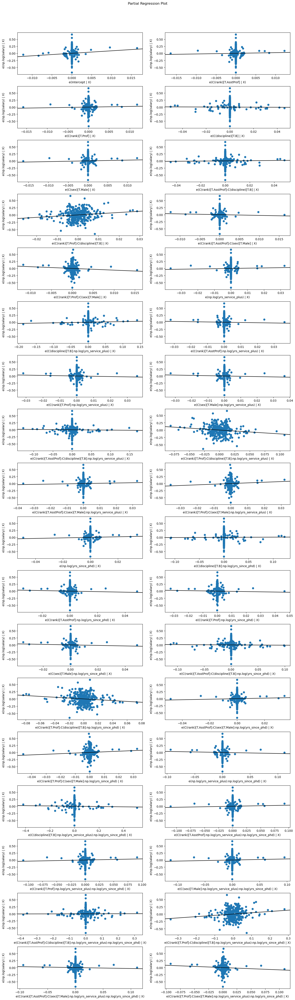

In [68]:
fig = sm.graphics.plot_partregress_grid(salarylog_mod, fig = plt.figure(figsize = (14,48)))
plt.show()

In [69]:
print(anova_lm(salarylog_mod, salarylog))

   df_resid        ssr  df_diff   ss_diff       F    Pr(>F)
0     361.0  11.048035      0.0       NaN     NaN       NaN
1     349.0  10.714123     12.0  0.333912  0.9064  0.540669


Our ANOVA tells us that the sub-model is fine to go with.

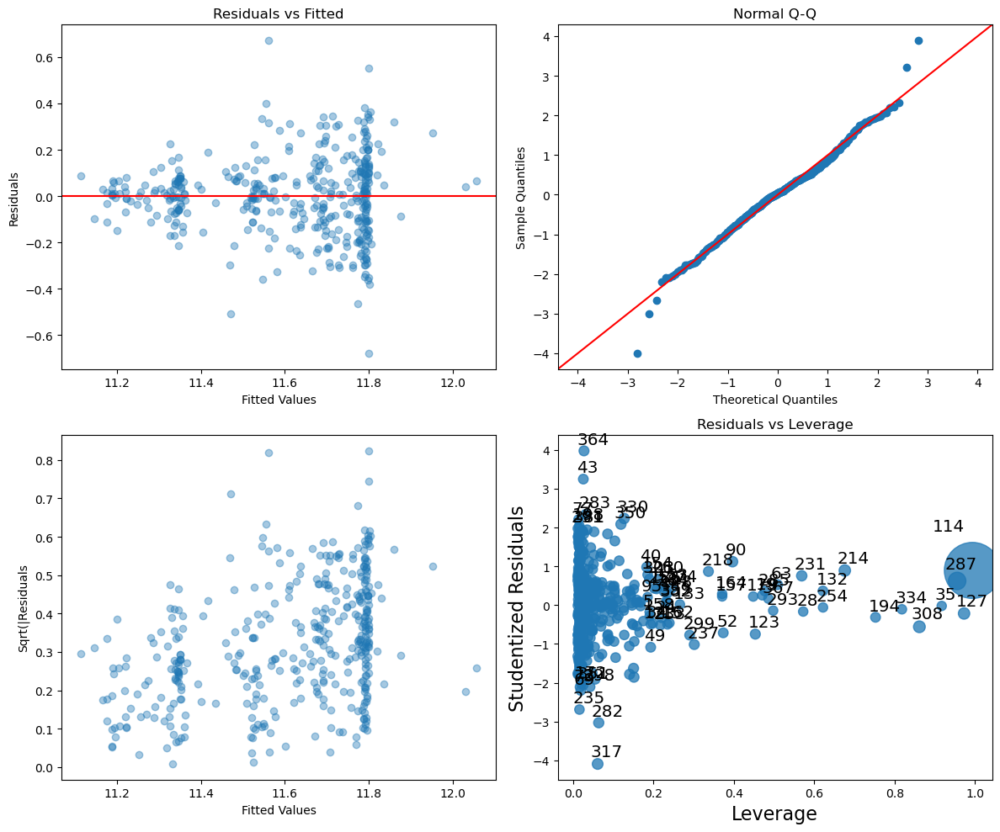

In [70]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarylog_mod.fittedvalues, salarylog_mod.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarylog_mod.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarylog_mod.fittedvalues, np.sqrt(np.abs(salarylog_mod.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
sm.graphics.influence_plot(salarylog_mod, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

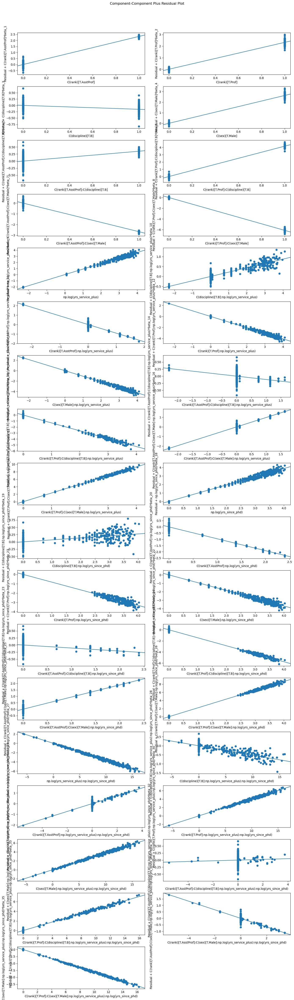

<F test: F=np.float64(0.7513207777942001), p=0.8922110228171687, df_denom=307, df_num=51>
<F test: F=1.1609128552136099, p=0.3143730715197353, df_denom=359, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 54, but rank is 51
  warnings.warn('covariance of constraints does not have full '


In [71]:
fig = sm.graphics.plot_ccpr_grid(salarylog_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarylog_mod, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarylog_mod, power = [2,3], test_type = 'fitted', use_f =True))

In [72]:
salarylog_modbp = bptest(salarylog_mod.resid, salarylog_mod.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarylog_modbp):
    print(f"{stat}:{score}")

BP statistic:68.51750070811057
BP p-value:0.0006016171769868353
f-value:2.1514360133513377
f p-value:0.0002690513365680197


In [73]:
X = salarylog_mod.model.exog
vif = pd.DataFrame({"Variable": salarylog_mod.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable            VIF
0                                           Intercept  503074.290513
1                                 C(rank)[T.AsstProf]   70685.093148
2                                     C(rank)[T.Prof]  115857.665044
3                                  C(discipline)[T.B]    4130.208304
4                                      C(sex)[T.Male]   44113.354708
5              C(rank)[T.AsstProf]:C(discipline)[T.B]    1662.228669
6                  C(rank)[T.Prof]:C(discipline)[T.B]    6510.080671
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]   60420.284952
8                      C(rank)[T.Prof]:C(sex)[T.Male]  123193.135269
9                            np.log(yrs_service_plus)  132852.450210
10        C(discipline)[T.B]:np.log(yrs_service_plus)    4013.822881
11       C(rank)[T.AsstProf]:np.log(yrs_service_plus)   25813.775851
12           C(rank)[T.Prof]:np.log(yrs_service_plus)  202907.279698
13            C(sex)[T.Male]:np.lo

In [74]:
rstudent = OLSInfluence(salarylog_mod).resid_studentized_external
df = salarylog_mod.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
317,-4.090169,0.000053,0.021117
364,3.973797,0.000085,0.033916
43,3.246811,0.001276,0.506702
0,0.327559,0.743435,1.000000
269,0.499878,0.617465,1.000000
268,-0.809739,0.418624,1.000000
267,0.065273,0.947992,1.000000
266,1.837434,0.066968,1.000000
265,0.752618,0.452170,1.000000
264,-0.771070,0.441170,1.000000


In [75]:
print(salarylog_mod.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
114  0.993197  3.245488        0.894561
287  0.955206  0.230782        0.624184
308  0.861319  0.053692       -0.557867
214  0.675868  0.046209        0.893187
127  0.972468  0.045286       -0.214841
317  0.061028  0.028943       -4.003871
90   0.396552  0.022872        1.119360
231  0.568626  0.020945        0.756326
330  0.126925  0.019904        2.220134
282  0.063763  0.016967       -2.994734


Finally, we see that this modified log-model performs almost just as well as the other submodels. We also see that sex is significant through its interactions with rank, years since phD, and years of service. When trying this same interactions in other models, it was still insignificant, only with a log response, does sex seem to be significant. 

The next thing we will do is test how accurately each of the models predict. Once we get our predictions of how they explain outside data, using cross validation, we will also use the mean squared error to measure how far off our predictions we are. Since our model responses are on different scales, we will need to compare them all on the same response scale, so we will be using regular Salary in dollars to compare our models. 

In [85]:
formula_log  = """
     C(rank)+C(discipline)+np.log(yrs_service_plus)+np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)+C(discipline)*np.log(yrs_since_phd)
     +np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(rank)*C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)
     +C(rank)*C(sex)*np.log(yrs_service_plus)*np.log(yrs_since_phd)
"""

formula_sqrt = """
     C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)+C(discipline)*np.sqrt(yrs_since_phd)
     +np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)
"""

formula_power = """
      C(rank)+C(discipline)+I(yrs_service_plus**0.52)+I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)+C(discipline)*I(yrs_since_phd**0.59)
      +I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)+C(rank)*C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)
"""

Y_true = salaries["salary"] 
Y_log = np.log(salaries["salary"])
Y_sqrt = 1/np.sqrt(salaries["salary"])
Y_pwr = salaries["salary"]**-0.25
X_log = dmatrix(formula_log + "- 1", data = salaries, return_type = 'dataframe')
X_sqrt = dmatrix(formula_sqrt + "- 1", data = salaries, return_type = 'dataframe')
X_pwr = dmatrix(formula_power + "- 1", data = salaries, return_type = 'dataframe')

X_log = pd.get_dummies(X_log, drop_first = True)
X_sqrt = pd.get_dummies(X_sqrt, drop_first = True)
X_pwr = pd.get_dummies(X_pwr, drop_first = True)


In [93]:
Xlog_train, Xlog_test, Ylog_train, Ylog_test = train_test_split(X_log, Y_true, test_size = 0.2, random_state = 0)
Xsqrt_train, Xsqrt_test, Ysqrt_train, Ysqrt_test = train_test_split(X_sqrt, Y_true, test_size = 0.2, random_state = 0)
Xpwr_train, Xpwr_test, Ypwr_train, Ypwr_test = train_test_split(X_pwr, Y_true, test_size = 0.2, random_state = 0)

enet_pipe = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0, max_iter = 50000)
)

eps = 1e-12

def f_inv_sqrt(y):
    y = np.asarray(y, dtype = float)
    return 1.0 / np.sqrt(np.clip(y, eps, None))

def inf_inv_sqrt(yt):
    yt = np.asarray(yt, dtype = float)
    yt = np.clip(yt, eps, None)
    return (1.0/yt)**2

def f_neg_quarter(y):
    y = np.asarray(y, dtype = float)
    return np.clip(y, eps, None)**(-0.25)

def inv_neg_quarter(yt):
    yt = np.asarray(yt, dtype = float)
    yt = np.clip(yt, eps, None)
    return 1.0 / (yt**4)


model_log = TransformedTargetRegressor(
    regressor = enet_pipe,
    func = lambda y: np.log(np.clip(y, eps, None)),
    inverse_func = np.exp
)

model_inv_sqrt = TransformedTargetRegressor(
    regressor = enet_pipe,
    func = f_inv_sqrt,
    inverse_func = inf_inv_sqrt
)

model_neg_quarter = TransformedTargetRegressor(
    regressor = enet_pipe,
    func = f_neg_quarter,
    inverse_func = inv_neg_quarter
)

nested_score_log = cross_val_score(model_log, X_log, Y_true, cv = 10, scoring = 'r2')
nested_score_sqrt = cross_val_score(model_inv_sqrt, X_sqrt, Y_true, cv = 10, scoring = 'r2')
nested_score_pwr = cross_val_score(model_neg_quarter, X_pwr, Y_true, cv = 10, scoring = 'r2')
mean_squared_error_log = cross_val_score(model_log, X_log, Y_true, cv = 10, scoring = 'neg_mean_squared_error')
mean_squared_error_sqrt = cross_val_score(model_inv_sqrt, X_sqrt, Y_true, cv = 10, scoring = 'neg_mean_squared_error')
mean_squared_error_pwr = cross_val_score(model_neg_quarter, X_pwr, Y_true, cv = 10, scoring = 'neg_mean_squared_error')

print("Nested CV R2 Score Log:", nested_score_log.mean())
print("Nested CV R2 Score Sqrt:", nested_score_sqrt.mean())
print("Nested CV R2 Score Pwr:", nested_score_pwr.mean())
print("MSE Log:", -mean_squared_error_log.mean())
print("MSE Sqrt:", -mean_squared_error_sqrt.mean())
print("MSE Pwr:", -mean_squared_error_pwr.mean())

model_log.fit(Xlog_train, Ylog_train)
model_log_cv = model_log.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_log_cv.coef_, index = X_log.columns)
tol = 1e-6
model_log_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", model_log_cv.alpha_)
print("Best l1 ratio:", model_log_cv.l1_ratio_)
print("Hold-Out Score:", model_log.score(Xlog_test, Ylog_test))
print("Chosen:", model_log_results[model_log_results["Selected"] == True])
print("Neglected:", model_log_results[model_log_results["Selected"] == False])

Nested CV R2 Score Log: 0.4117849727860703
Nested CV R2 Score Sqrt: 0.41489830327374033
Nested CV R2 Score Pwr: 0.42233058440048976
MSE Log: 533686339.98101455
MSE Sqrt: 527715197.43834054
MSE Pwr: 521433998.7905795
Best alpha: 0.0034741261395028356
Best l1 ratio: 0.05
Hold-Out Score: 0.5292850388908095
Chosen:                                                     Coefficient  Selected
C(rank)[AsstProf]                                      0.010111      True
C(rank)[Prof]                                         -0.003166      True
C(discipline)[T.B]                                     0.087875      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.029878      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.004905      True
C(rank)[T.Prof]:C(sex)[T.Male]                        -0.006715      True
C(discipline)[T.B]:np.log(yrs_service_plus)            0.105594      True
C(rank)[T.AsstProf]:np.log(yrs_service_plus)          -0.005983      True
C(rank)[T.Prof]:np.lo

In [94]:
model_inv_sqrt.fit(Xsqrt_train, Ysqrt_train)
model_inv_sqrt_cv = model_inv_sqrt.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_inv_sqrt_cv.coef_, index = X_sqrt.columns)
tol = 1e-6
model_inv_sqrt_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", model_inv_sqrt_cv.alpha_)
print("Best l1 ratio:", model_inv_sqrt_cv.l1_ratio_)
print("Hold-Out Score:", model_inv_sqrt.score(Xsqrt_test, Ysqrt_test))
print("Chosen:", model_inv_sqrt_results[model_inv_sqrt_results["Selected"] == True])
print("Neglected:", model_inv_sqrt_results[model_inv_sqrt_results["Selected"] == False])

Best alpha: 2.663770679986035e-07
Best l1 ratio: 1.0
Hold-Out Score: 0.5090096797553444
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                    -0.000039      True
C(rank)[Prof]                                          0.000283      True
C(discipline)[T.B]                                    -0.000528      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.000156      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.000118      True
np.sqrt(yrs_service)                                   0.000213      True
C(rank)[T.Prof]:np.sqrt(yrs_service)                  -0.000969      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt(...    -0.000089      True
C(rank)[T.Prof]:C(discipline)[T.B]:np.sqrt(yrs_...     0.000290      True
np.sqrt(yrs_since_phd)                                -0.000400      True
C(discipline)[T.B]:np.sqrt(yrs_since_phd)              0.000759      True
C(rank)[T.Prof]:

In [95]:
model_neg_quarter.fit(Xpwr_train, Ypwr_train)
model_neg_quarter_cv = model_neg_quarter.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_neg_quarter_cv.coef_, index = X_pwr.columns)
tol = 1e-6
model_neg_quarter_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", model_neg_quarter_cv.alpha_)
print("Best l1 ratio:", model_neg_quarter_cv.l1_ratio_)
print("Hold-Out Score:", model_neg_quarter.score(Xpwr_test, Ypwr_test))
print("Chosen:", model_neg_quarter_results[model_neg_quarter_results["Selected"] == True])
print("Neglected:", model_neg_quarter_results[model_neg_quarter_results["Selected"] == False])

Best alpha: 2.4017065265377613e-06
Best l1 ratio: 1.0
Hold-Out Score: 0.5024045311343381
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                    -0.000538      True
C(rank)[Prof]                                          0.002738      True
C(discipline)[T.B]                                    -0.003784      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.001394      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.002403      True
I(yrs_service_plus ** 0.52)                            0.002071      True
C(rank)[T.Prof]:I(yrs_service_plus ** 0.52)           -0.008327      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:I(yrs_se...    -0.000826      True
C(rank)[T.Prof]:C(discipline)[T.B]:I(yrs_servic...     0.003152      True
I(yrs_since_phd ** 0.59)                              -0.002953      True
C(discipline)[T.B]:I(yrs_since_phd ** 0.59)            0.005601      True
C(rank)[T.AsstP

In [96]:
outer = KFold(n_splits = 10, shuffle = True, random_state = 0)

enet_pipe_2 = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0, max_iter = 50000)
)

nested_score_log = cross_val_score(model_log, X_log, Y_true, cv = outer, scoring = 'r2')
nested_score_sqrt = cross_val_score(model_inv_sqrt, X_sqrt, Y_true, cv = outer, scoring = 'r2')
nested_score_pwr = cross_val_score(model_neg_quarter, X_pwr, Y_true, cv = outer, scoring = 'r2')
mean_squared_error_log = cross_val_score(model_log, X_log, Y_true, cv = outer, scoring = 'neg_mean_squared_error')
mean_squared_error_sqrt = cross_val_score(model_inv_sqrt, X_sqrt, Y_true, cv = outer, scoring = 'neg_mean_squared_error')
mean_squared_error_pwr = cross_val_score(model_neg_quarter, X_pwr, Y_true, cv = outer, scoring = 'neg_mean_squared_error')

print("Nested CV R2 Score log:", nested_score_log.mean())
print("Nested CV R2 Score sqrt:", nested_score_sqrt.mean())
print("Nested CV R2 Score pwr:", nested_score_pwr.mean())

model_log.fit(X_log, Y_log)
model_log_cv = model_log.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_log_cv.coef_, index = X_log.columns)
tol = 1e-6 
model_log_results = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", model_log_cv.alpha_)
print("Best l1 ratio:", model_log_cv.l1_ratio_)
print("Chosen:", model_log_results[model_log_results["Selected"] == True])
print("Neglected:", model_log_results[model_log_results["Selected"] == False])

Nested CV R2 Score log: 0.441276326740185
Nested CV R2 Score sqrt: 0.4391937108608541
Nested CV R2 Score pwr: 0.44613357357934547
Best alpha: 0.0020830993761923903
Best l1 ratio: 0.01
Chosen:                                                     Coefficient  Selected
C(rank)[AsstProf]                                      0.000448      True
C(rank)[Prof]                                         -0.000165      True
C(discipline)[T.B]                                     0.006331      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.001869      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.000797      True
np.log(yrs_service_plus)                              -0.000412      True
C(discipline)[T.B]:np.log(yrs_service_plus)            0.007880      True
C(rank)[T.Prof]:np.log(yrs_service_plus)               0.007753      True
C(rank)[T.Prof]:C(discipline)[T.B]:np.log(yrs_s...     0.004897      True
C(rank)[T.AsstProf]:C(sex)[T.Male]:np.log(yrs_s...    -0.002716     

In [98]:
model_inv_sqrt.fit(X_sqrt, Y_sqrt)
model_inv_sqrt_cv = model_inv_sqrt.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_inv_sqrt_cv.coef_, index = X_sqrt.columns)
tol = 1e-6 
model_inv_sqrt_results = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", model_inv_sqrt_cv.alpha_)
print("Best l1 ratio:", model_inv_sqrt_cv.l1_ratio_)
print("Chosen:", model_inv_sqrt_results[model_inv_sqrt_results["Selected"] == True])
print("Neglected:", model_inv_sqrt_results[model_inv_sqrt_results["Selected"] == False])

Best alpha: 0.00151066942164189
Best l1 ratio: 0.51
Chosen:                                                     Coefficient  Selected
C(rank)[Prof]                                         -0.326205      True
C(discipline)[T.B]                                     0.848771      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                -0.085577      True
C(rank)[T.Prof]:C(discipline)[T.B]                     0.294413      True
np.sqrt(yrs_service)                                  -0.036907      True
C(discipline)[T.B]:np.sqrt(yrs_service)                0.015558      True
C(rank)[T.AsstProf]:np.sqrt(yrs_service)              -0.019542      True
C(rank)[T.Prof]:np.sqrt(yrs_service)                   0.908015      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt(...     0.057552      True
np.sqrt(yrs_since_phd)                                 0.900537      True
C(discipline)[T.B]:np.sqrt(yrs_since_phd)             -0.926378      True
C(rank)[T.AsstProf]:np.sqrt(yrs_since_phd)          

In [99]:
model_neg_quarter.fit(X_pwr, Y_pwr)
model_neg_quarter_cv = model_neg_quarter.regressor_.named_steps["elasticnetcv"]

coef = pd.Series(model_neg_quarter_cv.coef_, index = X_pwr.columns)
tol = 1e-6 
model_neg_quarter_results = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", model_neg_quarter_cv.alpha_)
print("Best l1 ratio:", model_neg_quarter_cv.l1_ratio_)
print("Chosen:", model_neg_quarter_results[model_neg_quarter_results["Selected"] == True])
print("Neglected:", model_neg_quarter_results[model_neg_quarter_results["Selected"] == False])

Best alpha: 0.0007310636953085797
Best l1 ratio: 0.03
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                     0.001746      True
C(rank)[Prof]                                         -0.006286      True
C(discipline)[T.B]                                     0.022686      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                -0.004632      True
C(rank)[T.Prof]:C(discipline)[T.B]                     0.007665      True
I(yrs_service_plus ** 0.52)                           -0.003974      True
C(rank)[T.AsstProf]:I(yrs_service_plus ** 0.52)       -0.000518      True
C(rank)[T.Prof]:I(yrs_service_plus ** 0.52)            0.027882      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:I(yrs_se...     0.003504      True
C(rank)[T.Prof]:C(discipline)[T.B]:I(yrs_servic...    -0.000651      True
I(yrs_since_phd ** 0.59)                               0.024420      True
C(discipline)[T.B]:I(yrs_since_phd ** 0.59)       

Here, we see that the power-model seems to predict the best all around the board. Both when we do 10-fold and when we do a hold out. We see that not only does the power-model has the lowest Mean Squared Error, it also consistently has the highest R-squared, so, it seems to explain more of the variation of the data. However, in general, for prediction we would probably rather use something like a decision tree or gradient boosting model for more accurate predictions. 